# **TASK 1**

## Data loading

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
dataset = pd.read_csv('/content/dataset.csv')

dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [ ]:
dataset.drop(['DOL Vehicle ID', 'VIN (1-10)'], axis=1, inplace=True)

In [ ]:
dataset.isna().sum()

,0
County,0
City,0
State,0
Postal Code,0
Model Year,0
Make,0
Model,20
Electric Vehicle Type,0
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0
Electric Range,0


In [ ]:
dataset.dropna(subset=['Model', 'Legislative District', 'Electric Utility', 'Vehicle Location'], inplace=True)

dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112152 entries, 2 to 112633
Data columns (total 15 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   County                                             112152 non-null  object 
 1   City                                               112152 non-null  object 
 2   State                                              112152 non-null  object 
 3   Postal Code                                        112152 non-null  int64  
 4   Model Year                                         112152 non-null  int64  
 5   Make                                               112152 non-null  object 
 6   Model                                              112152 non-null  object 
 7   Electric Vehicle Type                              112152 non-null  object 
 8   Clean Alternative Fuel Vehicle (CAFV) Eligibility  112152 non-null  object 
 9 

In [ ]:
dataset['Postal Code'] = dataset['Postal Code'].astype(str)
dataset['Model Year'] = dataset['Model Year'].astype(str)

In [ ]:
dataset.rename(columns={'Clean Alternative Fuel Vehicle (CAFV) Eligibility': 'CAFV Eligibility'}, inplace=True)

In [ ]:
vehicle_locations = []
for location in dataset['Vehicle Location']:
    location_parts = location.split()
    processed_parts = []
    for part in location_parts[1:]:
        processed_part = part.strip('()')
        processed_parts.append(float(processed_part))
    vehicle_locations.append(processed_parts)

dataset['Vehicle Location'] = vehicle_locations
dataset['Vehicle Location'] = dataset['Vehicle Location'].apply(lambda x: str(x))
print(dataset.info())
dataset.head()

<class 'pandas.core.frame.DataFrame'>
Index: 112152 entries, 2 to 112633
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   County                 112152 non-null  object 
 1   City                   112152 non-null  object 
 2   State                  112152 non-null  object 
 3   Postal Code            112152 non-null  object 
 4   Model Year             112152 non-null  object 
 5   Make                   112152 non-null  object 
 6   Model                  112152 non-null  object 
 7   Electric Vehicle Type  112152 non-null  object 
 8   CAFV Eligibility       112152 non-null  object 
 9   Electric Range         112152 non-null  int64  
 10  Base MSRP              112152 non-null  int64  
 11  Legislative District   112152 non-null  float64
 12  Vehicle Location       112152 non-null  object 
 13  Electric Utility       112152 non-null  object 
 14  2020 Census Tract      112152 non-null  i

,County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,CAFV Eligibility,Electric Range,Base MSRP,Legislative District,Vehicle Location,Electric Utility,2020 Census Tract
2,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,"[-120.50721, 46.60448]",PACIFICORP,53077001602
3,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,"[-121.7515, 48.53892]",PUGET SOUND ENERGY INC,53057951101
4,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,"[-122.20596, 47.97659]",PUGET SOUND ENERGY INC,53061041500
5,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,0,1.0,"[-122.18384, 47.8031]",PUGET SOUND ENERGY INC,53061051916
6,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,0,38.0,"[-122.23019, 47.94949]",PUGET SOUND ENERGY INC,53061040900


In [ ]:
dataset['CAFV Eligibility'].value_counts()

,count
CAFV Eligibility,
Clean Alternative Fuel Vehicle Eligible,58395
Eligibility unknown as battery range has not been researched,39097
Not eligible due to low battery range,14660


In [ ]:
cafv_eligibility_mapping = {
    'Clean Alternative Fuel Vehicle Eligible': 'eligible',
    'Not eligible due to low battery range': 'not eligible',
    'Eligibility unknown as battery range has not been researched': 'unknown'
}

dataset['CAFV Eligibility'] = dataset['CAFV Eligibility'].map(cafv_eligibility_mapping)
dataset['CAFV Eligibility'].value_counts()

,count
CAFV Eligibility,
eligible,58395
unknown,39097
not eligible,14660


## **UNIVARIATE**

## Numerical

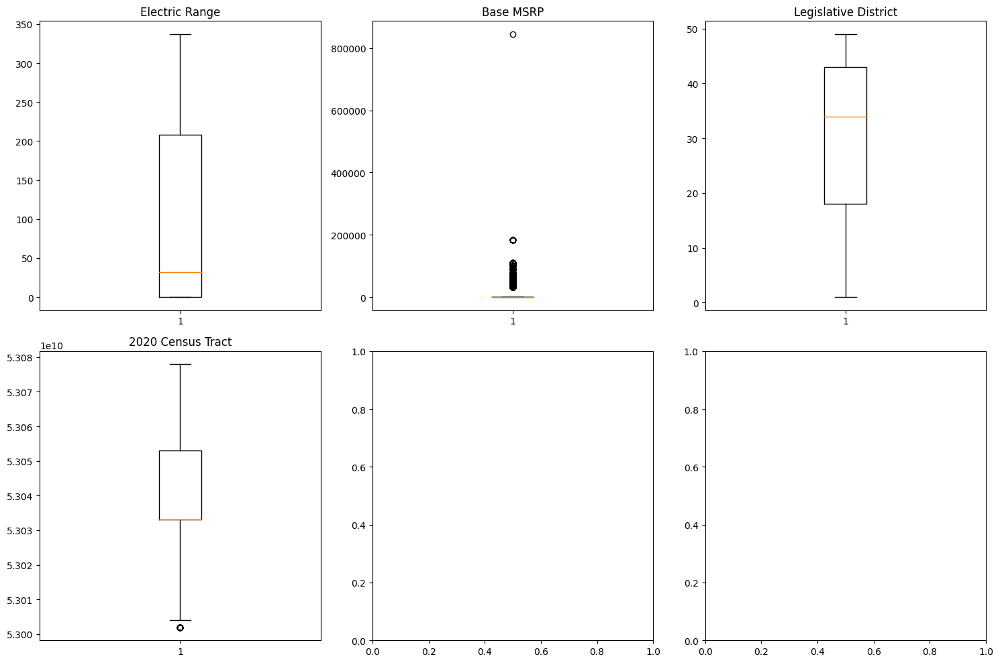

In [ ]:
numeric_cols = dataset.select_dtypes(include=np.number).columns
num_plots = len(numeric_cols)
rows = (num_plots + 2) // 3  # Calculate the number of rows needed

fig, axes = plt.subplots(rows, 3, figsize=(15, 5 * rows))
axes = axes.flatten()

for i, col in enumerate(numeric_cols):
  plt.subplot(rows, 3, i + 1)
  plt.boxplot(dataset[col])
  plt.title(col)

plt.tight_layout()
plt.show()


In [ ]:
# drop the base msrp column
dataset.drop('Base MSRP', axis=1, inplace=True)

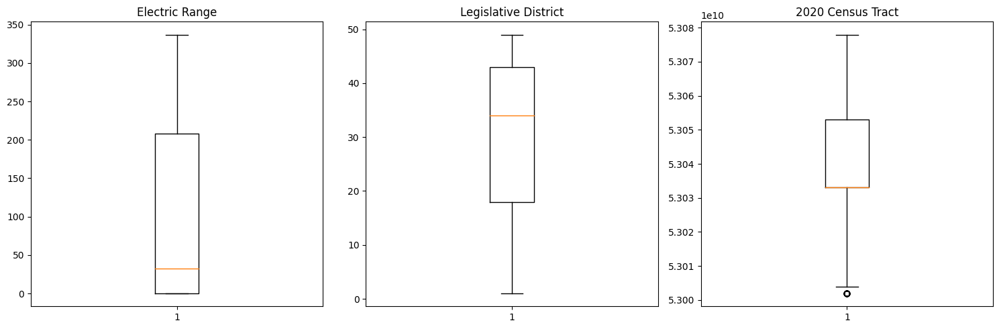

In [ ]:
numeric_cols = dataset.select_dtypes(include=np.number).columns
num_plots = len(numeric_cols)
rows = (num_plots + 2) // 3  # Calculate the number of rows needed

fig, axes = plt.subplots(rows, 3, figsize=(15, 5 * rows))
axes = axes.flatten()

for i, col in enumerate(numeric_cols):
  plt.subplot(rows, 3, i + 1)
  plt.boxplot(dataset[col])
  plt.title(col)

plt.tight_layout()
plt.show()


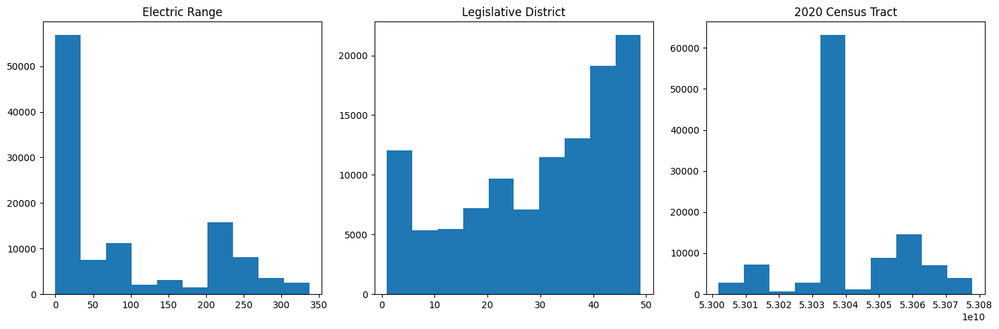

In [ ]:
numeric_cols = dataset.select_dtypes(include=np.number).columns
num_plots = len(numeric_cols)
rows = (num_plots + 2) // 3  # Calculate the number of rows needed

fig, axes = plt.subplots(rows, 3, figsize=(15, 5 * rows))
axes = axes.flatten()

for i, col in enumerate(numeric_cols):
    plt.subplot(rows, 3, i + 1)
    plt.hist(dataset[col])
    plt.title(col)

plt.tight_layout()
plt.show()


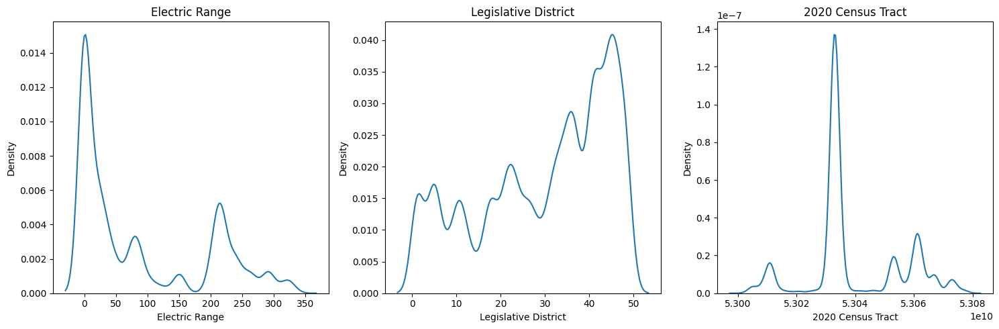

In [ ]:
numeric_cols = dataset.select_dtypes(include=np.number).columns
num_plots = len(numeric_cols)
rows = (num_plots + 2) // 3  # Calculate the number of rows needed

fig, axes = plt.subplots(rows, 3, figsize=(15, 5 * rows))
axes = axes.flatten()

for i, col in enumerate(numeric_cols):
  plt.subplot(rows, 3, i + 1)
  sns.kdeplot(dataset[col])
  plt.title(col)

plt.tight_layout()
plt.show()


## Categorical

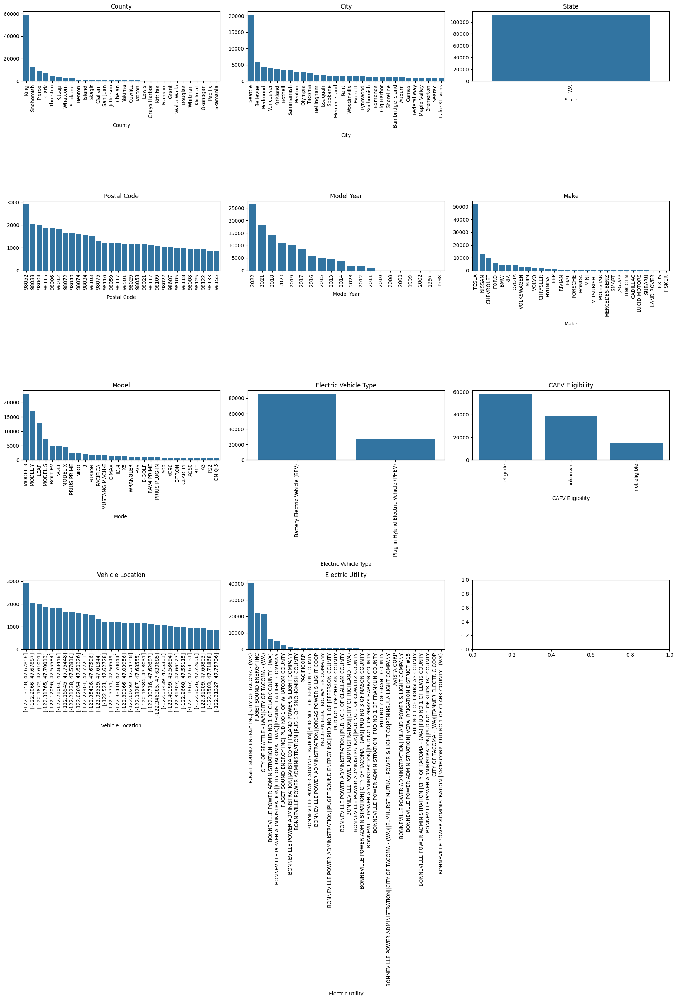

In [ ]:
categorical_cols = dataset.select_dtypes(include=['object']).columns
num_plots = len(categorical_cols)
rows = (num_plots + 2) // 3  # Calculate the number of rows needed

fig, axes = plt.subplots(rows, 3, figsize=(19, 7 * rows))
axes = axes.flatten()

for i, col in enumerate(categorical_cols):
    plt.subplot(rows, 3, i + 1)
    # value_counts = dataset[col].value_counts()[:30]  # Top 30 values
    value_counts = dataset[col].value_counts(sort=False).nlargest(30)  # Top 30 values
    sns.barplot(x=value_counts.index, y=value_counts.values)
    plt.title(col)
    plt.xticks(rotation=90)
    plt.xlabel(col, labelpad=10)

plt.tight_layout()
plt.show()


## **Bivariate**

## Num vs Num

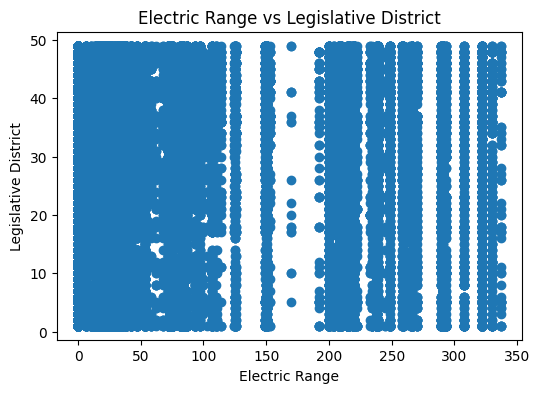

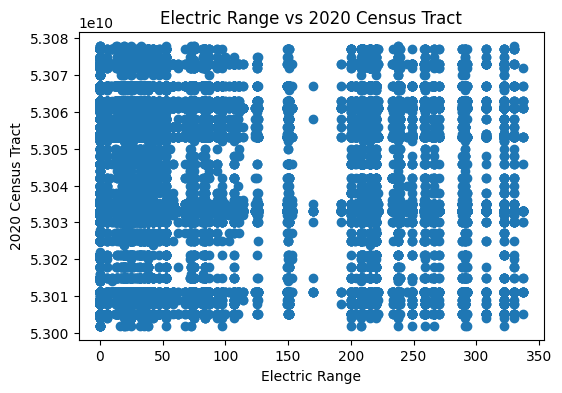

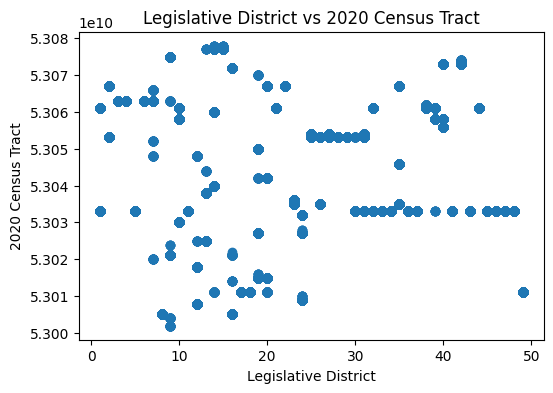

In [ ]:
numeric_cols = dataset.select_dtypes(include=np.number).columns
num_plots = len(numeric_cols)
rows = (num_plots + 2) // 3

for i in range(len(numeric_cols)):
  for j in range(i + 1, len(numeric_cols)):
    plt.figure(figsize=(6, 4))
    plt.scatter(dataset[numeric_cols[i]], dataset[numeric_cols[j]])
    plt.xlabel(numeric_cols[i])
    plt.ylabel(numeric_cols[j])
    plt.title(f'{numeric_cols[i]} vs {numeric_cols[j]}')
    plt.show()



## Num vs Cat

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



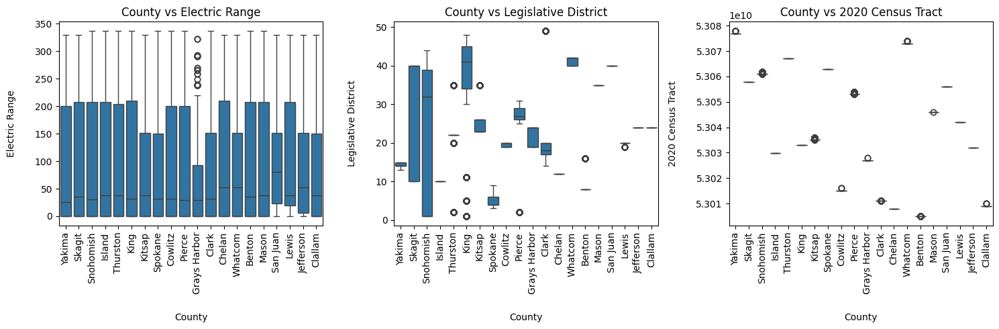

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



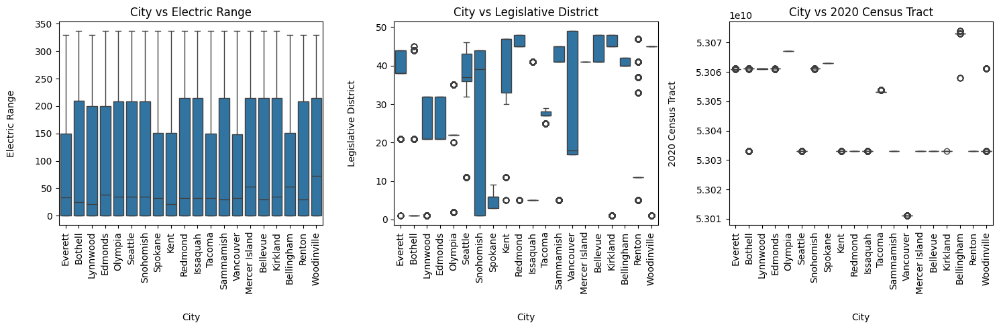

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



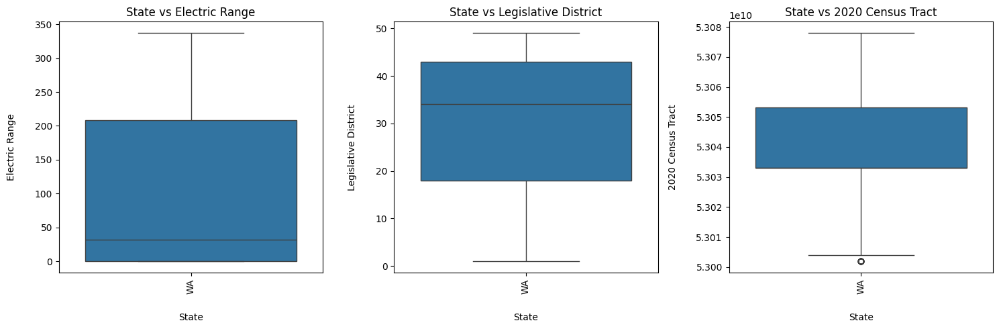

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



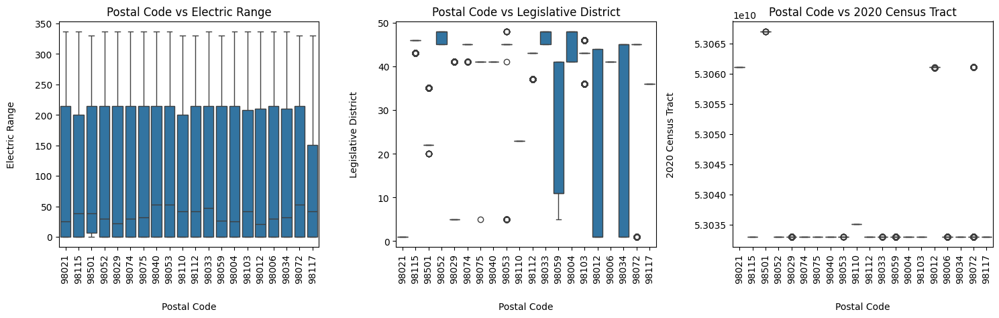

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



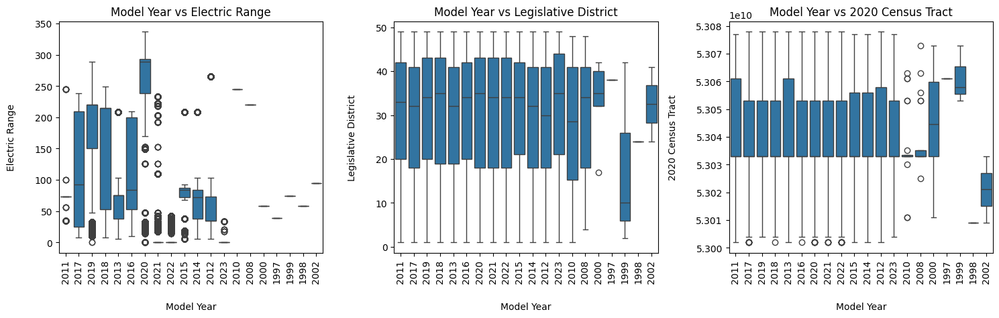

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



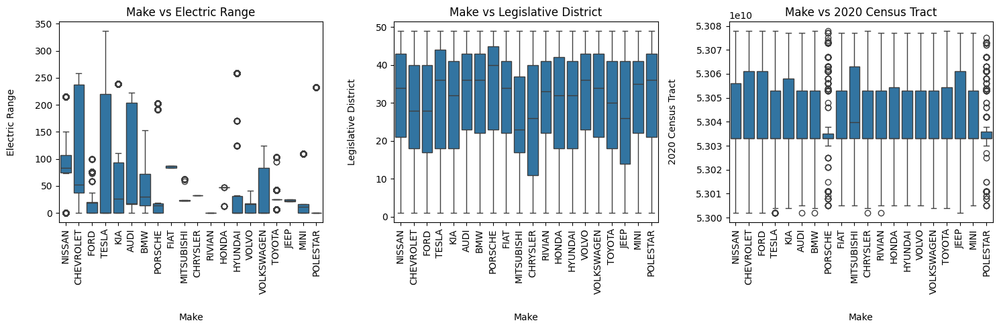

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



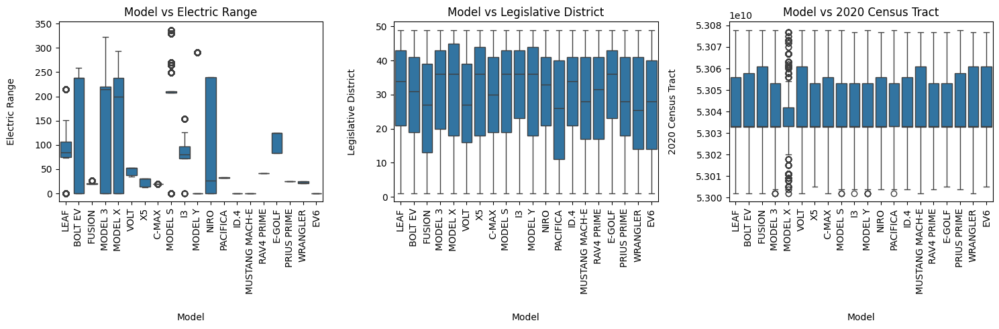

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



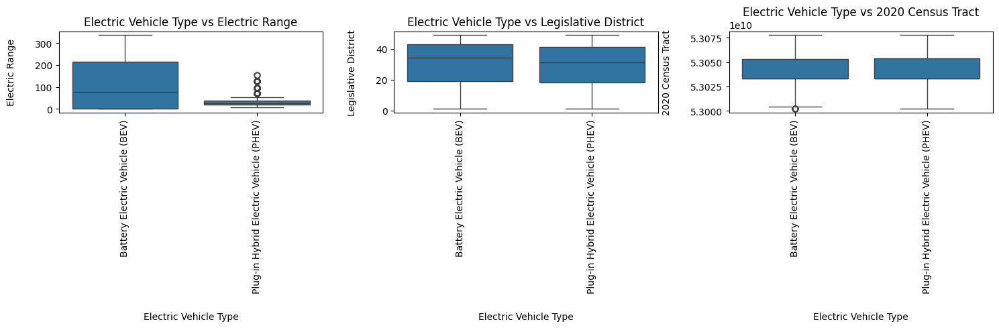

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



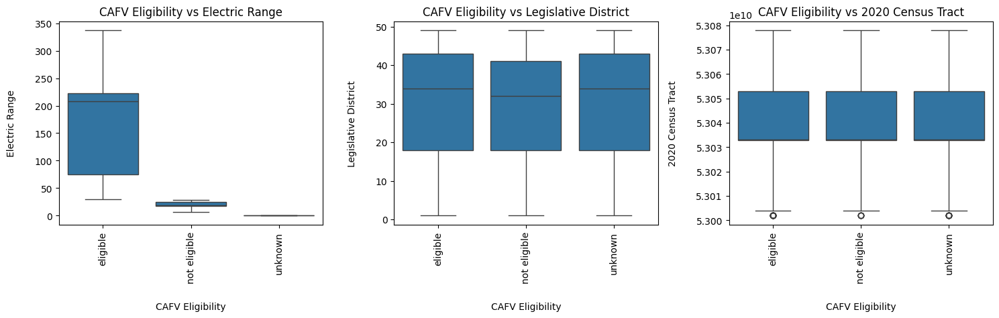

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



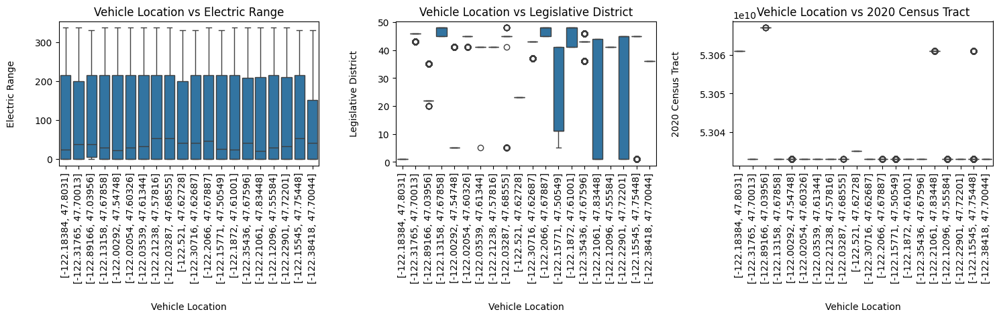

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.

<ipython-input-82-67f28ed551a3>:26: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



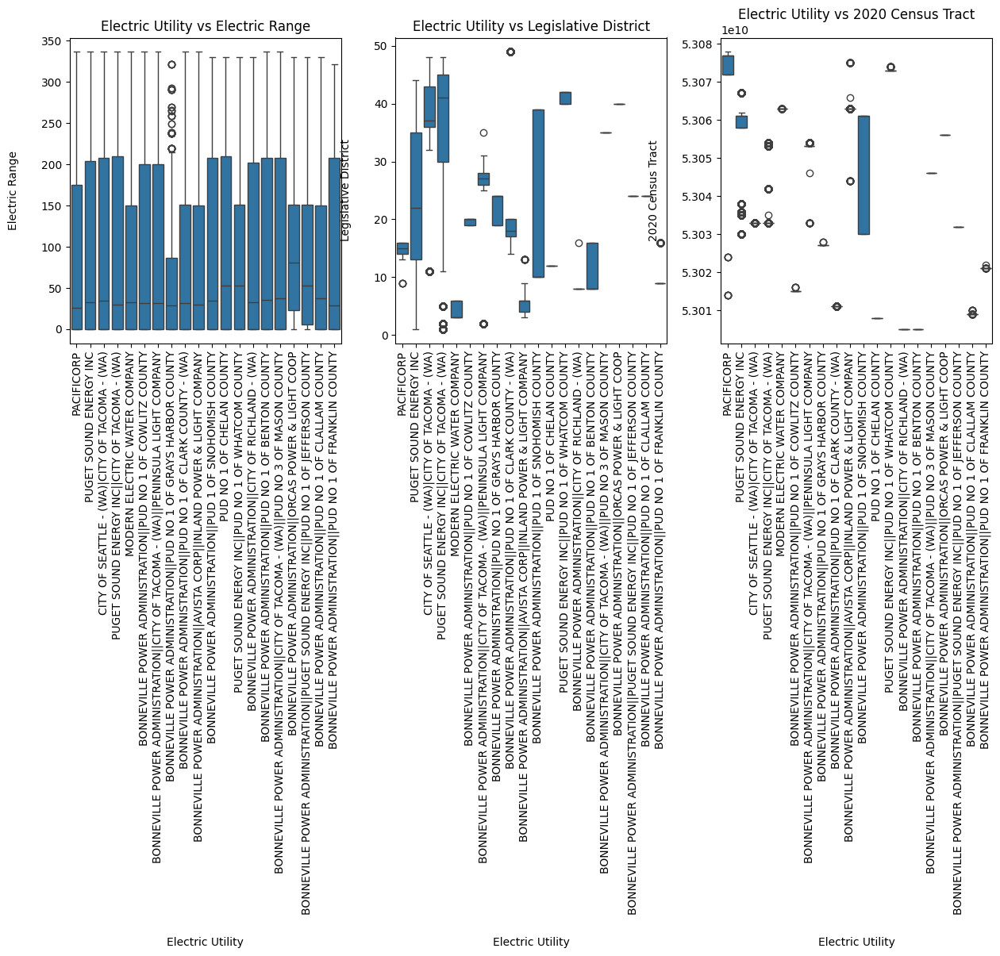

In [ ]:
numeric_cols = dataset.select_dtypes(include=np.number).columns
categorical_cols = dataset.select_dtypes(include=['object']).columns

for cat_col in categorical_cols:
  top_20_values = dataset[cat_col].value_counts().nlargest(20).index.tolist()
  filtered_dataset = dataset[dataset[cat_col].isin(top_20_values)]

  num_plots = len(numeric_cols)
  rows = (num_plots + 2) // 3

  fig, axes = plt.subplots(rows, 3, figsize=(15, 5 * rows))
  axes = axes.flatten()

  for i, num_col in enumerate(numeric_cols):
    plt.subplot(rows, 3, i + 1)
    sns.boxplot(x=filtered_dataset[cat_col], y=filtered_dataset[num_col])
    plt.title(f"{cat_col} vs {num_col}")
    plt.xticks(rotation=90)
    plt.xlabel(cat_col, labelpad=20)
    plt.ylabel(num_col, rotation=90, labelpad=20)

  plt.tight_layout()
  plt.show()


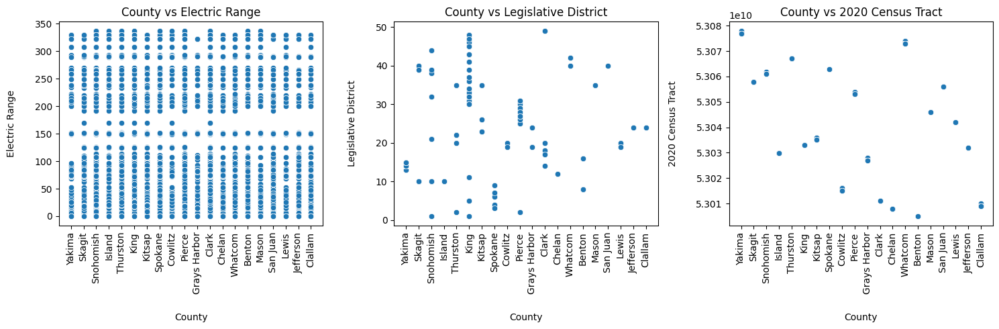

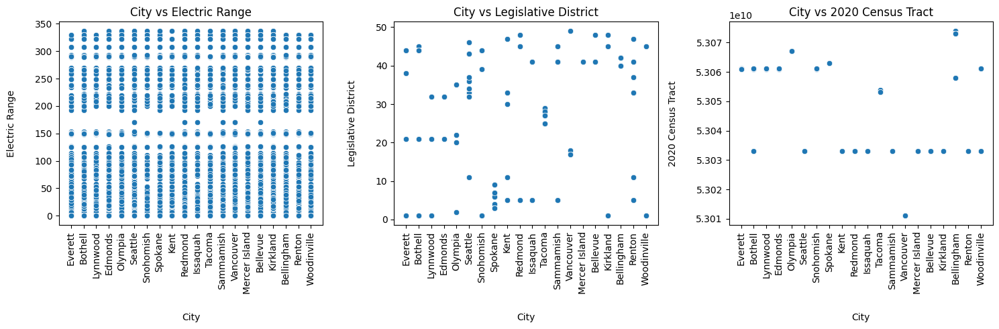

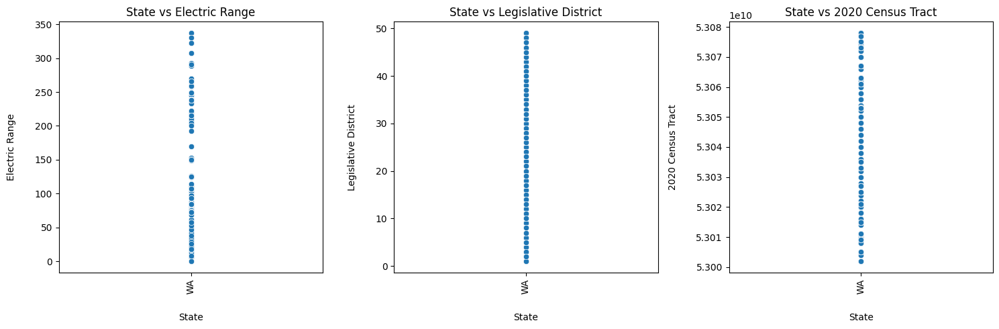

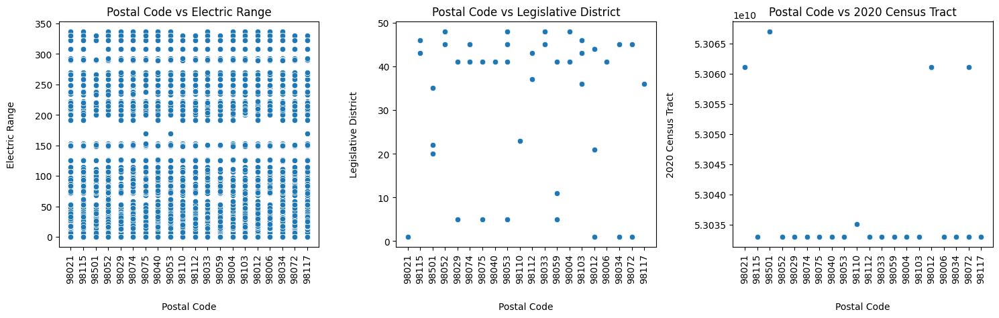

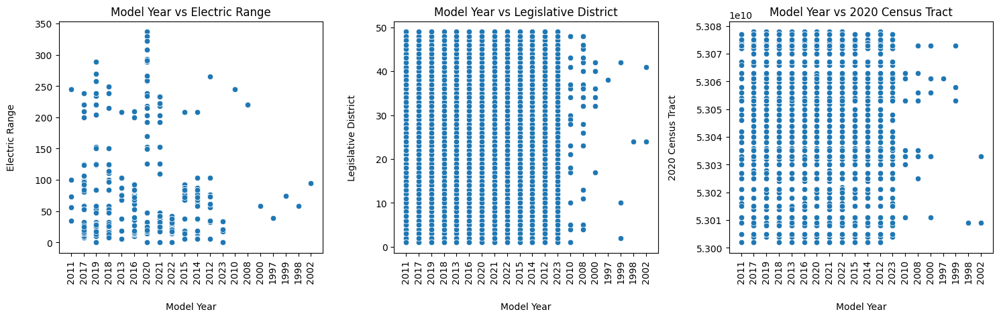

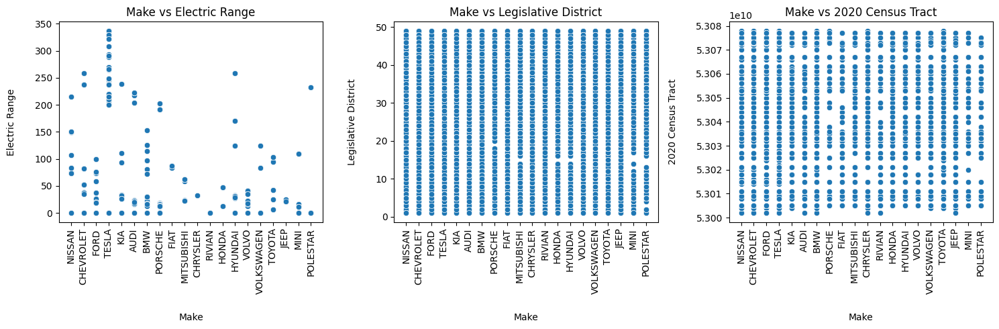

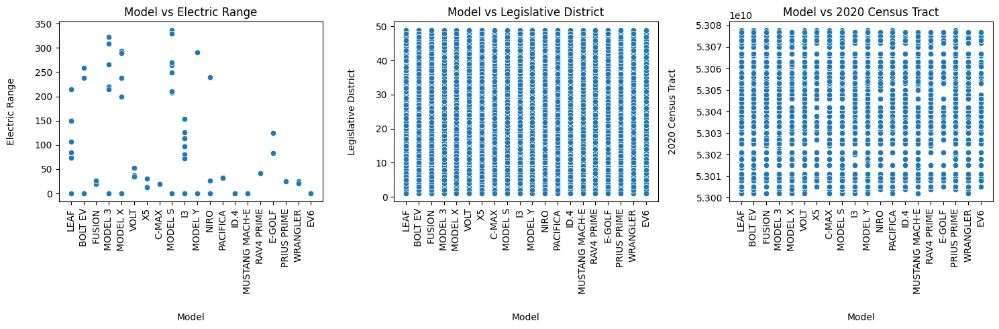

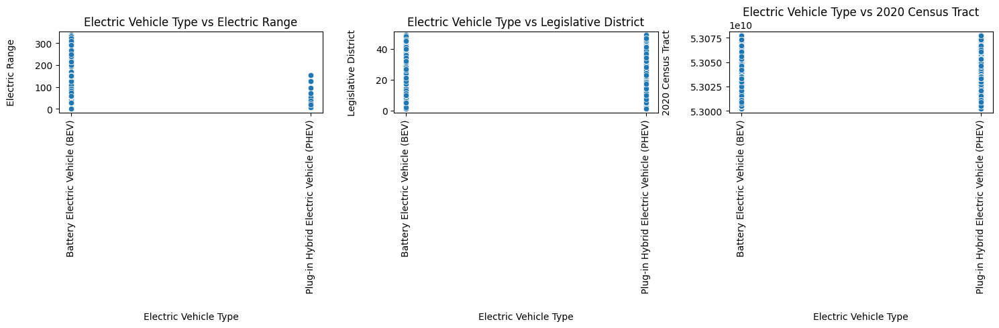

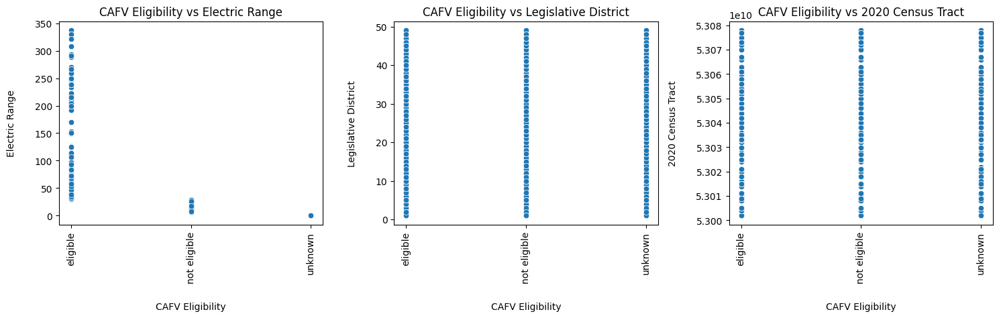

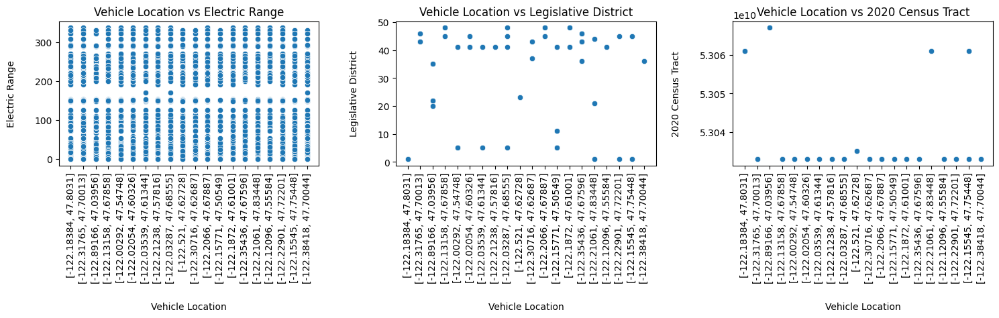

<ipython-input-83-1583156edd24>:26: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



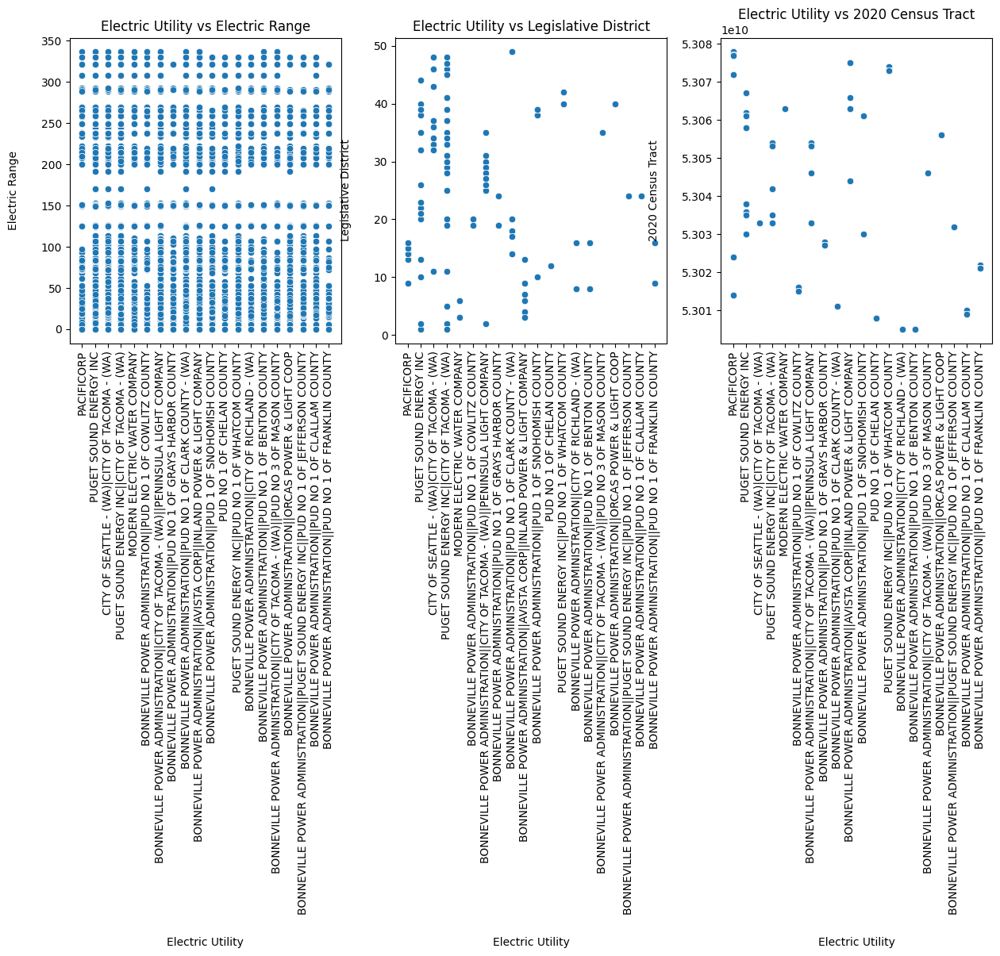

In [ ]:
numeric_cols = dataset.select_dtypes(include=np.number).columns
categorical_cols = dataset.select_dtypes(include=['object']).columns

for cat_col in categorical_cols:
  top_20_values = dataset[cat_col].value_counts().nlargest(20).index.tolist()
  filtered_dataset = dataset[dataset[cat_col].isin(top_20_values)]

  num_plots = len(numeric_cols)
  rows = (num_plots + 2) // 3

  fig, axes = plt.subplots(rows, 3, figsize=(15, 5 * rows))
  axes = axes.flatten()

  for i, num_col in enumerate(numeric_cols):
    plt.subplot(rows, 3, i + 1)
    sns.scatterplot(x=filtered_dataset[cat_col], y=filtered_dataset[num_col])
    plt.title(f"{cat_col} vs {num_col}")
    plt.xticks(rotation=90)
    plt.xlabel(cat_col, labelpad=20)
    plt.ylabel(num_col, rotation=90, labelpad=20)

  plt.tight_layout()
  plt.show()


## Cat vs Cat

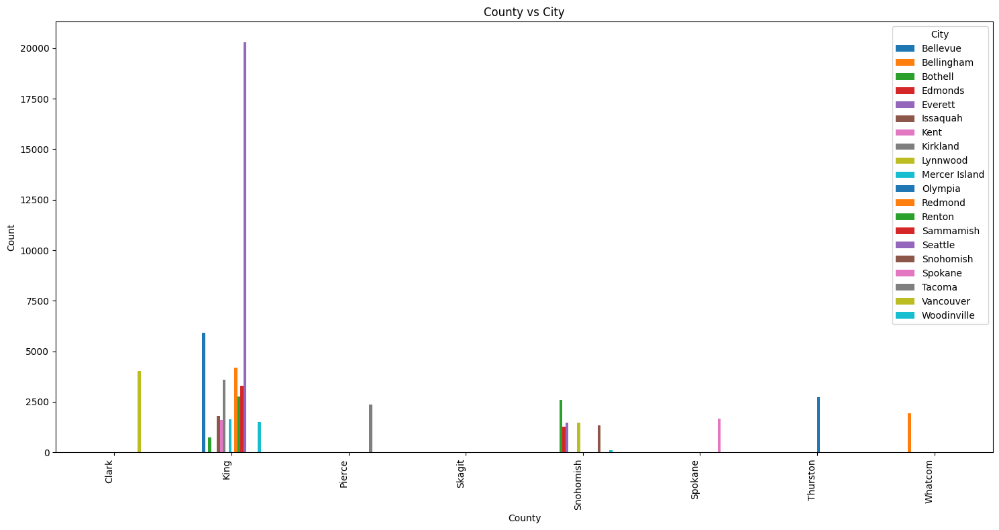

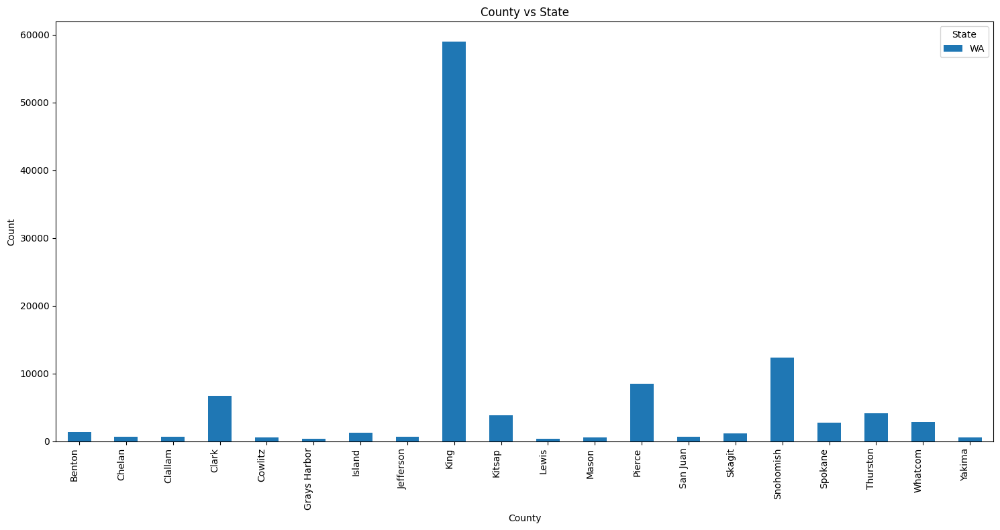

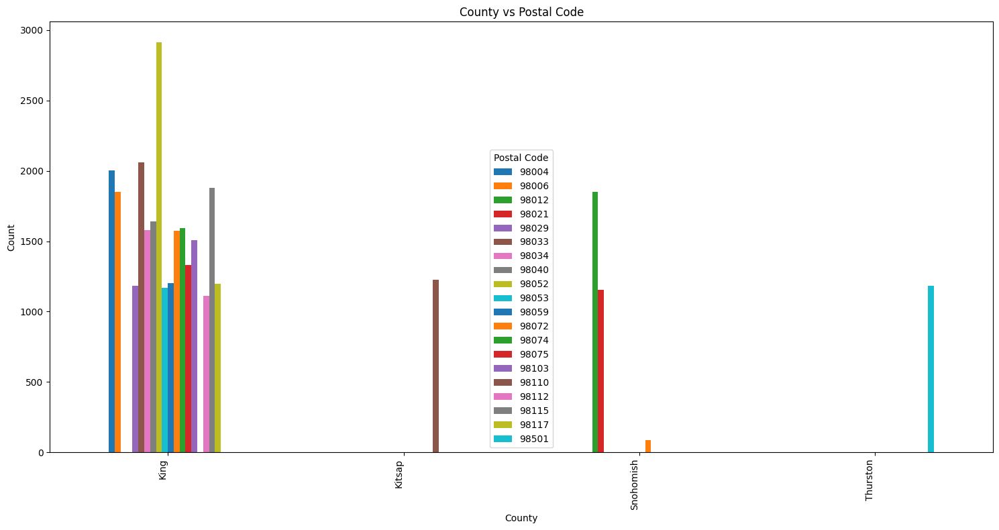

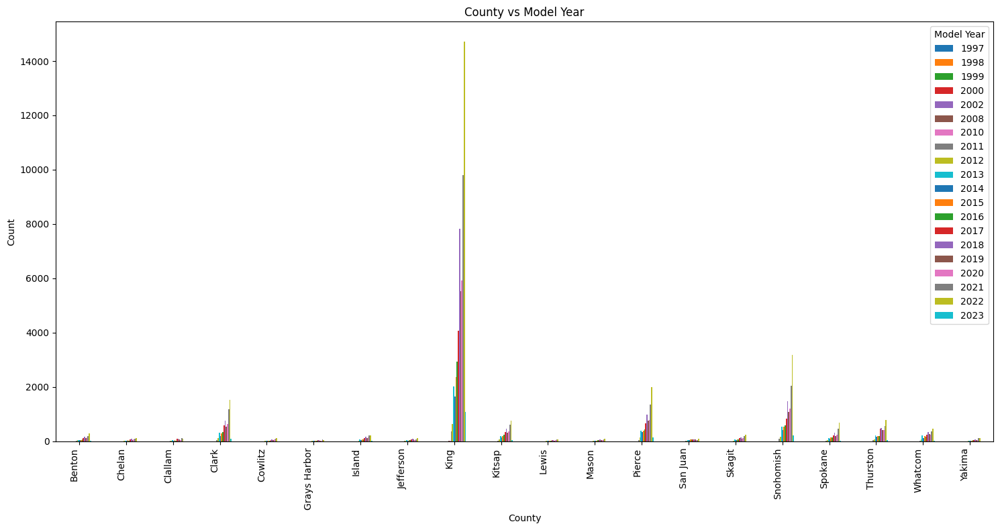

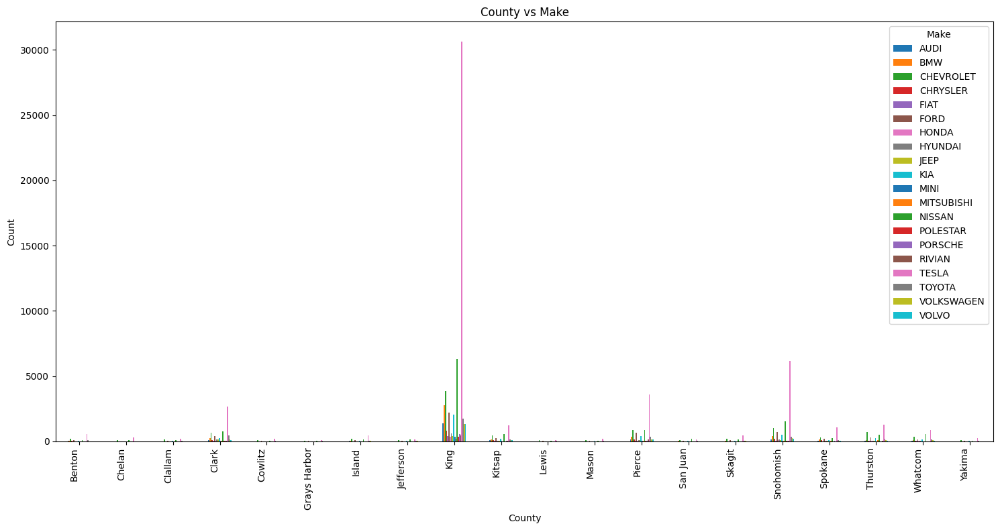

...

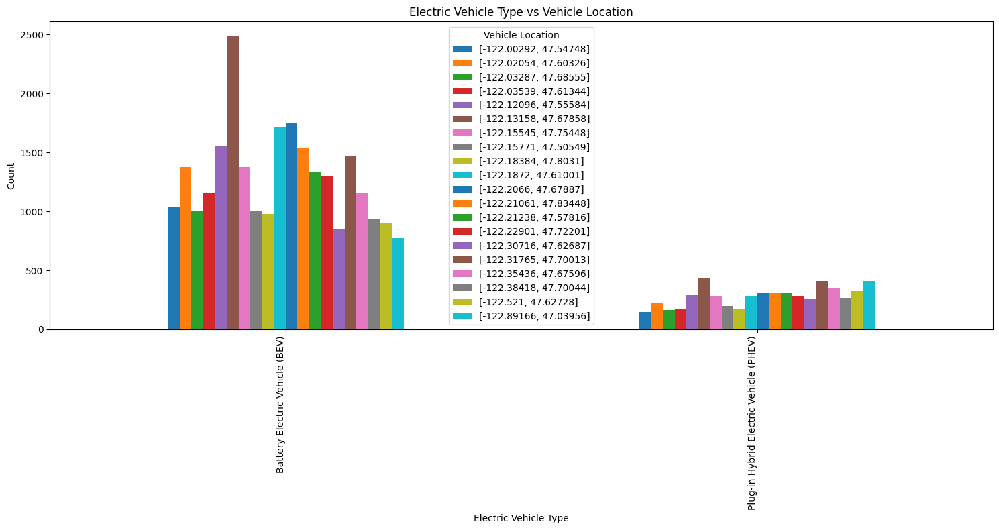

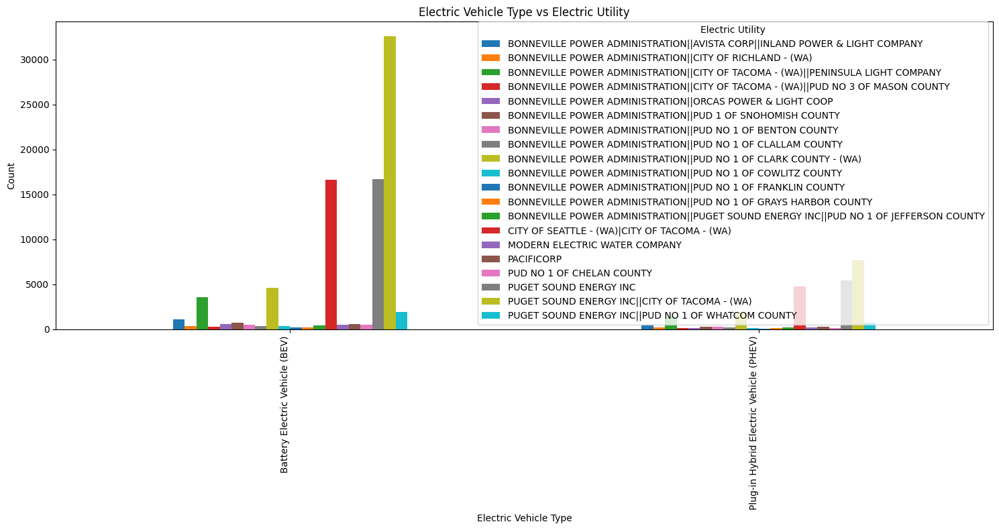

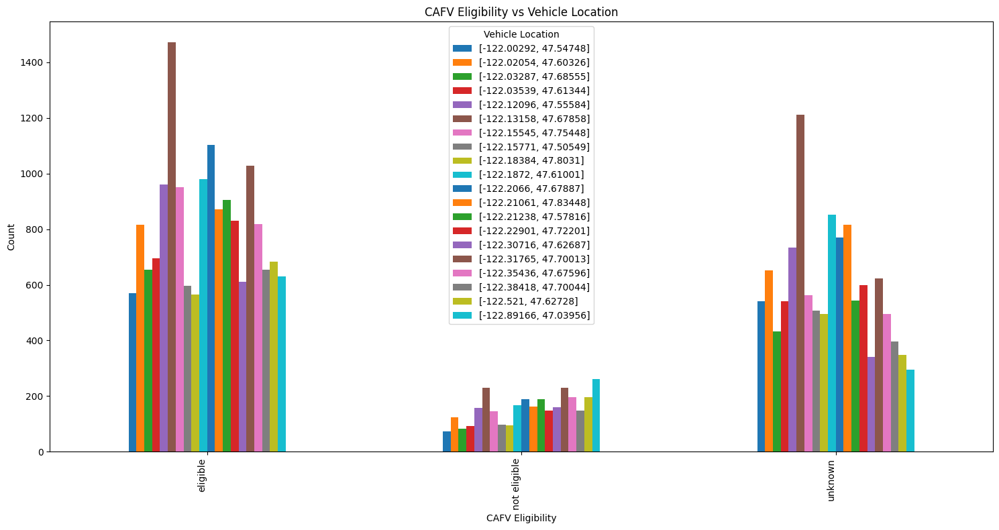

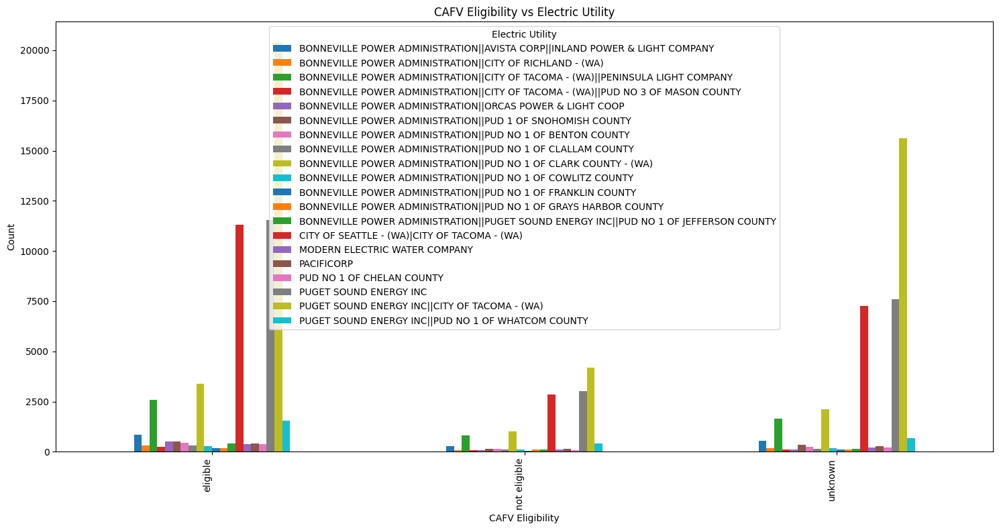

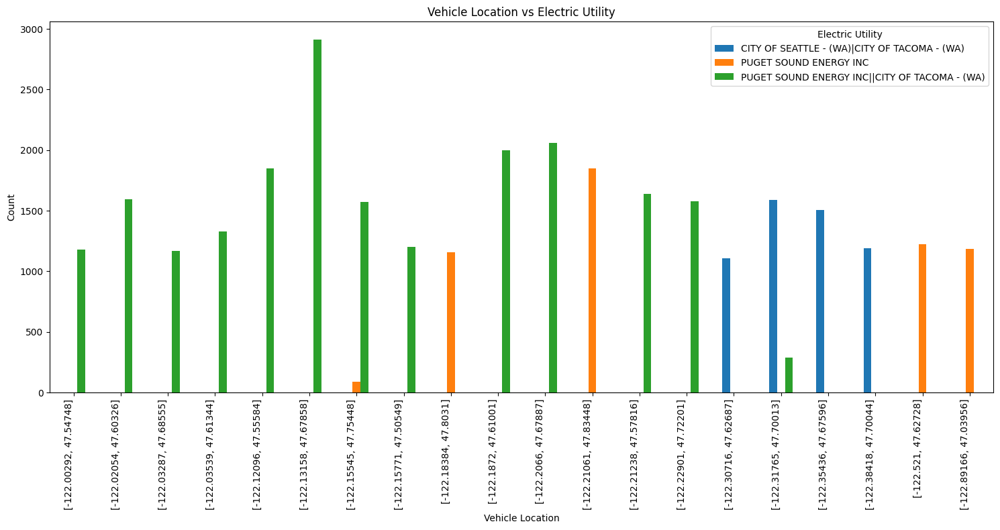

In [ ]:
categorical_cols = dataset.select_dtypes(include=['object']).columns

for i in range(len(categorical_cols)):
  for j in range(i + 1, len(categorical_cols)):
    # Select the top 20 values for each categorical column
    top_20_col_i = dataset[categorical_cols[i]].value_counts().nlargest(20).index.tolist()
    top_20_col_j = dataset[categorical_cols[j]].value_counts().nlargest(20).index.tolist()

    # Filter the dataset to include only the top 20 values for both columns
    filtered_dataset = dataset[
        dataset[categorical_cols[i]].isin(top_20_col_i) & dataset[categorical_cols[j]].isin(top_20_col_j)
    ]

    # Create a cross-tabulation of the two categorical columns
    cross_tab = pd.crosstab(filtered_dataset[categorical_cols[i]], filtered_dataset[categorical_cols[j]])

    # Plot the grouped bar plot
    cross_tab.plot(kind='bar', figsize=(15, 8))
    plt.title(f"{categorical_cols[i]} vs {categorical_cols[j]}")
    plt.xlabel(categorical_cols[i])
    plt.ylabel("Count")
    plt.xticks(rotation=90, ha="right")
    plt.legend(title=categorical_cols[j])
    plt.tight_layout()
    plt.show()


# **TASK 2**

In [ ]:
import plotly.express as px

In [ ]:
df = pd.read_csv('/content/dataset.csv')
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [ ]:
fig = px.choropleth(
    df,
    locations='State',
    locationmode='USA-states',
    color='Make',
    scope='usa',
    title='noob'
)
fig.show()

In [99]:
type(df['Model Year'][0])

numpy.int64

# **TASK 3**

In [88]:
!pip install bar_chart_race

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.8/156.8 kB 3.2 MB/s eta 0:00:00


In [106]:
import bar_chart_race as bcr

df = pd.read_csv('/content/dataset.csv')

In [109]:
df_bcr = dataset.groupby(['Model Year', 'Make'])['Make'].count().unstack().fillna(0)
bcr.bar_chart_race(
    df=df_bcr,
    filename='ev_make_animation.mp4',
    orientation='h',
    sort='desc',
    n_bars=10,
    fixed_order=False,
    fixed_max=True,
    steps_per_period=10,
    interpolate_period=False,
    label_bars=True,
    bar_size=.95,
    period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'},
    title='EV Make Count Over Model Years',
    cmap='dark12',
    dpi=144,
    fig=None,
    bar_kwargs={'alpha': .7},
    filter_column_colors=False
)



/usr/local/lib/python3.10/dist-packages/bar_chart_race/_make_chart.py:889: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/usr/local/lib/python3.10/dist-packages/bar_chart_race/_make_chart.py:286: UserWarning:

FixedFormatter should only be used together with FixedLocator

/usr/local/lib/python3.10/dist-packages/bar_chart_race/_make_chart.py:287: UserWarning:

FixedFormatter should only be used together with FixedLocator

/usr/local/lib/python3.10/dist-packages/bar_chart_race/_make_chart.py:226: UserWarning:

Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`

